In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn')
sns.set_palette("hls")

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt

plt.rc('font', family='NanumBarunGothic') 

# EDA_using graph

In [20]:
df = pd.read_excel('/content/preprocessing_data.xlsx')
df

,서울시 동,가구원수,서울시 구,구별 가구수,반려동물 비율,반려동물 가구수 구,반려동물 가구수 동,면적,반려동물 가구밀도,폐사안락사수,보호소 수,보호소 밀도,폐사안락사 비율,동물병원약국개수,동물병원약국 밀도
0,가락1동,9534,송파구,255766,0.216,55245.456,2059.344,1.34,1536.823881,15,1,0.746269,11.194030,11,8.208955
1,가락2동,11482,송파구,255766,0.216,55245.456,2480.112,0.96,2583.450000,13,1,1.041667,13.541667,11,11.458333
2,가락본동,10576,송파구,255766,0.216,55245.456,2284.416,1.13,2021.607080,19,1,0.884956,16.814159,10,8.849558
3,가리봉동,4901,구로구,164083,0.195,31996.185,955.695,0.40,2389.237500,0,0,0.000000,0.000000,2,5.000000
4,가산동,14124,금천구,103432,0.179,18514.328,2528.196,2.52,1003.252381,0,0,0.000000,0.000000,14,5.555556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420,청구동,5764,중구,55093,0.191,10522.763,1100.924,0.34,3238.011765,0,0,0.000000,0.000000,2,4.545455
421,동화동,3771,중구,55093,0.191,10522.763,720.261,0.26,2770.234615,0,0,0.000000,0.000000,2,2.325581
422,항동,5988,구로구,164083,0.195,31996.185,1167.660,1.40,834.042857,0,0,0.000000,0.000000,2,3.174603
423,위례동,9041,송파구,255766,0.216,55245.456,1952.856,2.55,765.825882,0,0,0.000000,0.000000,2,1.904762


In [3]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   서울시 동       425 non-null    object 
 1   가구원수        425 non-null    int64  
 2   서울시 구       425 non-null    object 
 3   구별 가구수      425 non-null    int64  
 4   반려동물 비율     425 non-null    float64
 5   반려동물 가구수 구  425 non-null    float64
 6   반려동물 가구수 동  425 non-null    float64
 7   면적          425 non-null    float64
 8   반려동물 가구밀도   425 non-null    float64
 9   폐사안락사수      425 non-null    int64  
 10  보호소 수       425 non-null    int64  
 11  보호소 밀도      425 non-null    float64
 12  폐사안락사 비율    425 non-null    float64
 13  동물병원약국개수    425 non-null    int64  
 14  동물병원약국 밀도   425 non-null    float64
dtypes: float64(8), int64(5), object(2)
memory usage: 49.9+ KB
None


In [4]:
df = df.drop(df.columns[[0,1,2,3,4,5,6,7,9,10,13]],axis=1)

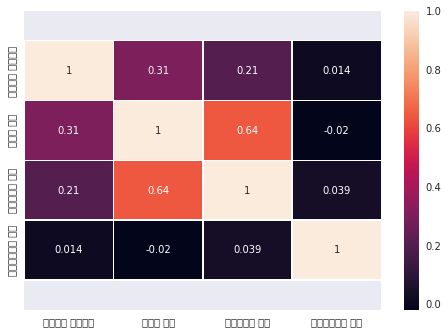

In [5]:
g = sns.heatmap(df.corr(), annot=True, linewidths=.5)
bottom, top = g.get_ylim() # To prevent the heatmap plot from being cut off
g.set_ylim(bottom+0.5, top-0.5)
plt.show()

Density of pet household

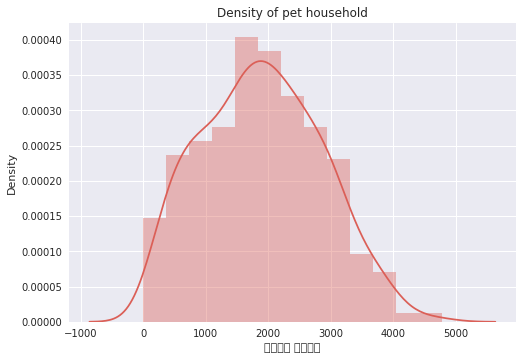

In [6]:
# there is no skwness
sns.distplot(df['반려동물 가구밀도'])
plt.title('Density of pet household')
plt.show()

Density of pet hospital & pharmacy

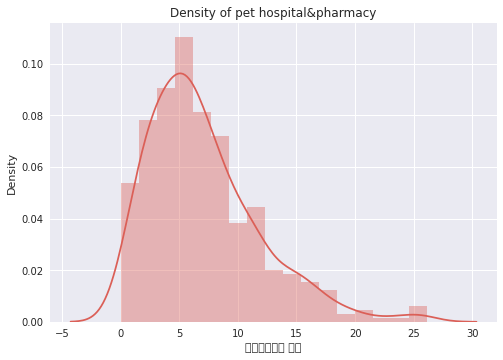

In [7]:
# right-skewed
sns.distplot(df['동물병원약국 밀도'])
plt.title('Density of pet hospital&pharmacy')
plt.show()

Density of animal shelters

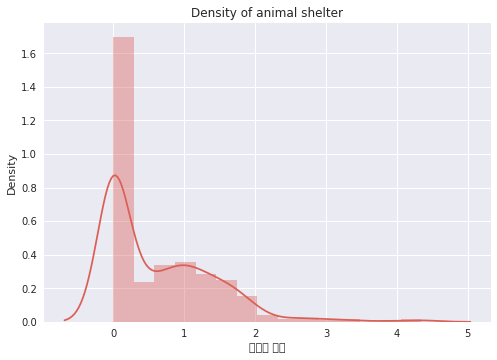

In [8]:
# right-skwede
# many 0
sns.distplot(df['보호소 밀도'])
plt.title('Density of animal shelter')
plt.show()

Density of animal death/euthanasia

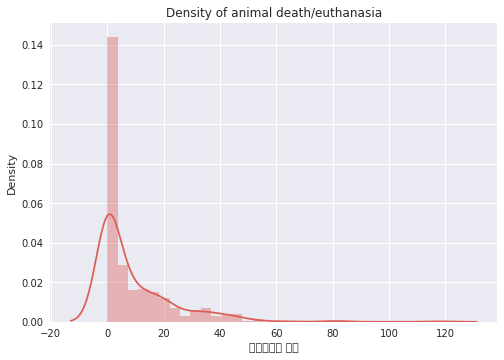

In [10]:
# very similar with density of animal shelter graph
sns.distplot(df['폐사안락사 비율'])
plt.title('Density of animal death/euthanasia')
plt.show()

correlationship between each features

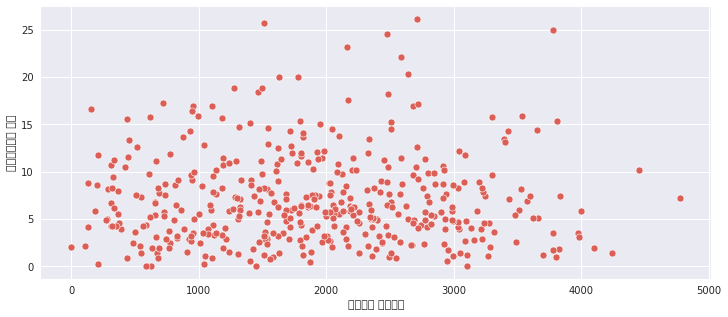

In [11]:
plt.figure(figsize=(12, 5))
sns.scatterplot(x='반려동물 가구밀도', y='동물병원약국 밀도', data=df)

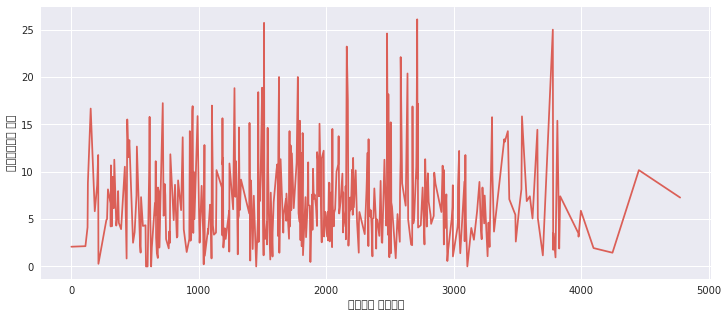

In [12]:
# The change in the density of animal hospitals and pharmacies according to the change in the density of pet households was also confirmed by line plot.
# Overall, the distribution of density in animal hospitals and pharmacies is very wide
plt.figure(figsize=(12, 5))
sns.lineplot(x='반려동물 가구밀도', y='동물병원약국 밀도', data=df)

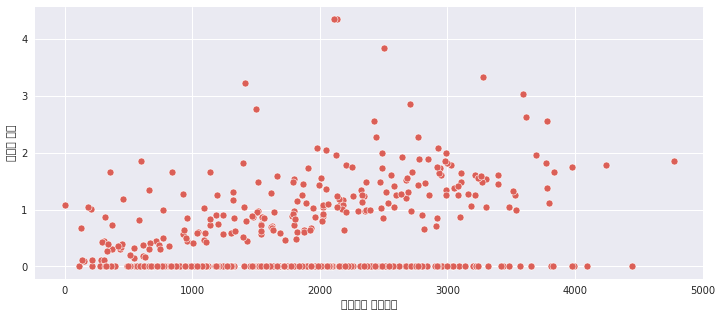

In [13]:
plt.figure(figsize=(12, 5))
sns.scatterplot(x='반려동물 가구밀도', y='보호소 밀도', data=df)

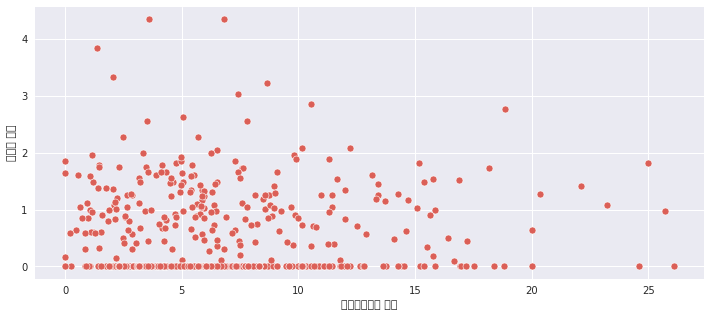

In [14]:
plt.figure(figsize=(12, 5))
sns.scatterplot(x='동물병원약국 밀도', y='보호소 밀도', data=df)

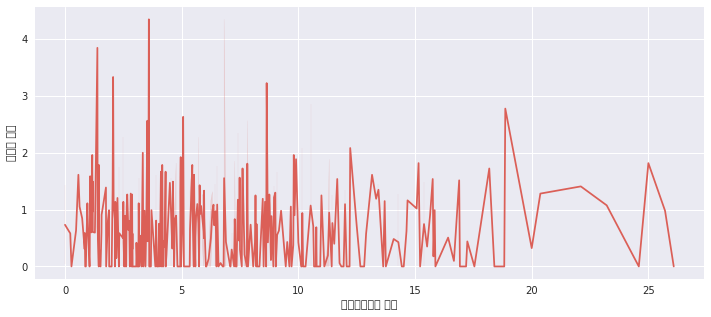

In [15]:
plt.figure(figsize=(12, 5))
sns.lineplot(x='동물병원약국 밀도', y='보호소 밀도', data=df)



*   The actual data is more than 2 dimension, but the contents we visualized are two-dimensional.
*  Therefore, it is expected that another cluster may be visible when visualized in multi dimensions



# EDA_folium

In [16]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [19]:
import json
import folium

In [21]:
df = pd.read_excel('/content/preprocessing_data.xlsx')

pet_area=df[['서울시 동','반려동물 가구밀도']]
shelter_area=df[['서울시 동','보호소 밀도']]
death_area=df[['서울시 동','폐사안락사 비율']]
pet_hospitalParmacy_area=df[['서울시 동','동물병원약국 밀도']]

In [23]:
geo_path = '/content/seoul_geo.json'
geo_json=open(geo_path,encoding='utf-8')
geo_str = json.load(geo_json)

In [24]:
from branca.utilities import legend_scaler
from IPython.core.oinspect import highlight

df = pet_area

seoul_map = folium.Map(location=[37.5503,126.982],zoom_start=10.5,
                       tiles='cartodb positron')
seoul_map.choropleth(geo_data=geo_str,
                     data=df,
                     columns=df.columns,
                     key_on='properties.name',
                     highlight=True,
                     fill_color="BuGn",
                        fill_opacity=0.7,
                        line_opacity=0.2,
                     legend_name='the density of pet households in Seoul',
                     )
seoul_map.save('seoul_map_pet_area.html')
seoul_map

In [25]:
from IPython.core.oinspect import highlight

df = shelter_area

seoul_map = folium.Map(location=[37.5503,126.982],zoom_start=10.5,
                       tiles='cartodb positron')
seoul_map.choropleth(geo_data=geo_str,
                     data=df,
                     columns=df.columns,
                     key_on='properties.name',
                     highlight=True,
                     fill_color="PuBu",
                        fill_opacity=0.7,
                        line_opacity=0.2,
                     legend_name='the density of animal shelters'
                     )
seoul_map.save('seoul_map_shelter_area.html')
seoul_map

In [26]:
from IPython.core.oinspect import highlight

df = death_area

seoul_map = folium.Map(location=[37.5503,126.982],zoom_start=10.5,
                       tiles='cartodb positron')
seoul_map.choropleth(geo_data=geo_str,
                     data=df,
                     columns=df.columns,
                     key_on='properties.name',
                     highlight=True,
                     fill_color="OrRd",
                        fill_opacity=0.7,
                        line_opacity=0.2,
                     legend_name='the density of animal death/euthanasia'
                     )
seoul_map.save('seoul_map_pet_death_area.html')
seoul_map

In [27]:
from IPython.core.oinspect import highlight

df = pet_hospitalParmacy_area

seoul_map = folium.Map(location=[37.5503,126.982],zoom_start=10.5,
                       tiles='cartodb positron')
seoul_map.choropleth(geo_data=geo_str,
                     data=df,
                     columns=df.columns,
                     key_on='properties.name',
                     highlight=True,
                     fill_color="YlGn",
                        fill_opacity=0.7,
                        line_opacity=0.2,
                     legend_name='the proximity of animal hospitals/pharmacies.'
                     )
seoul_map.save('seoul_map_pet_hospitalParmacy_area.html')
seoul_map